In [51]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [133]:
pristine = pd.read_pickle("C:/Users/gails/Desktop/Team Sediment/Chapter 1 - Theory/Current Analyses/Adding Nutrient & Sediment Associations/pristine_benthos_2026-03-29")

pristine = pristine[['B0', 'G0', 'S0', 'Cp']]
pristine[['B0', 'G0', 'S0']] = pristine[['B0', 'G0', 'S0']]*100
pristine['B0'] = pristine['B0'].astype(int)
pristine['G0'] = pristine['G0'].astype(int)
pristine['S0'] = pristine['S0'].astype(int)

SED_NUTR = pd.read_pickle("C:/Users/gails/Desktop/Team Sediment/Chapter 1 - Theory/Current Analyses/Adding Nutrient & Sediment Associations/SED_NUTR_benthos_2026-03-29")
SED_NUTR = SED_NUTR[['B0', 'G0', 'S0', 'Cp']]
SED_NUTR[['B0', 'G0', 'S0']] = SED_NUTR[['B0', 'G0', 'S0']]*100
SED_NUTR['B0'] = SED_NUTR['B0'].astype(int)
SED_NUTR['G0'] = SED_NUTR['G0'].astype(int)
SED_NUTR['S0'] = SED_NUTR['S0'].astype(int)
SED_NUTR

,B0,G0,S0,Cp
0,0,0,100,0.471101
1,0,1,99,0.471101
2,0,2,98,0.471101
3,0,3,97,0.471101
4,0,4,96,0.471101
...,...,...,...,...
5146,98,1,1,0.363410
5147,98,2,0,0.358255
5148,99,0,1,0.358295
5149,99,1,0,0.355318


#### Load Data

In [40]:
pristine = pd.read_pickle("C:/Users/gails/Desktop/Team Sediment/Chapter 1 - Theory/Current Analyses/Adding Nutrient & Sediment Associations/pristine_benthos_2026-03-29")
pristine = pristine[['B0', 'G0', 'S0', 'Cp']]
pristine[['B0', 'G0', 'S0']] = pristine[['B0', 'G0', 'S0']]*100

NUTR = pd.read_pickle("C:/Users/gails/Desktop/Team Sediment/Chapter 1 - Theory/Current Analyses/Adding Nutrient & Sediment Associations/NUTR_benthos_2026-03-29")
NUTR = NUTR[['B0', 'G0', 'S0', 'Cp']]
NUTR[['B0', 'G0', 'S0']] = NUTR[['B0', 'G0', 'S0']]*100

SED = pd.read_pickle("C:/Users/gails/Desktop/Team Sediment/Chapter 1 - Theory/Current Analyses/Adding Nutrient & Sediment Associations/SED_benthos_2026-03-29")
SED = SED[['B0', 'G0', 'S0', 'Cp']]
SED[['B0', 'G0', 'S0']] = SED[['B0', 'G0', 'S0']]*100

SED_NUTR = pd.read_pickle("C:/Users/gails/Desktop/Team Sediment/Chapter 1 - Theory/Current Analyses/Adding Nutrient & Sediment Associations/SED_NUTR_benthos_2026-03-29")
SED_NUTR = SED_NUTR[['B0', 'G0', 'S0', 'Cp']]
SED_NUTR[['B0', 'G0', 'S0']] = SED_NUTR[['B0', 'G0', 'S0']]*100

#### Ternary Diagram 1

From [plotly](https://plotly.com/python/ternary-plots/)

In [50]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [33]:
import plotly.express as px

fig = make_subplots(
    rows=2, cols=2,
    specs=[[{"type":"ternary"}, {"type":"ternary"}],
           [{"type":"ternary"}, {"type":"ternary"}]],
    subplot_titles=("PRISTINE", "NUTRIENT IMPACTED", "SEDIMENT IMPACTED", "NUTRIENT AND SEDIMENT IMPACTED"),
    horizontal_spacing=0.08,
    vertical_spacing=0.12,

)

fig1 = px.scatter_ternary(pristine, a="B0", b="G0", c="S0", hover_name="Cp",
                         color="Cp")

fig2 = px.scatter_ternary(NUTR, a="B0", b="G0", c="S0", hover_name="Cp", 
                         color="Cp")

fig3 = px.scatter_ternary(SED, a="B0", b="G0", c="S0", hover_name="Cp", 
                         color="Cp")

fig4 = px.scatter_ternary(SED_NUTR, a="B0", b="G0", c="S0", hover_name="Cp", 
                         color="Cp")


ternary_keys = ['ternary', 'ternary2', 'ternary3', 'ternary4']

fig.update_layout(**{
    key: dict(
        aaxis_title="B0",
        baxis_title="G0",
        caxis_title="S0"
    )
    for key in ternary_keys
})


fig.update_layout(width=1200, height=1000)

fig.update_annotations(yshift=35)

fig.update_layout(coloraxis=dict(cmin=0, cmax=1))


for trace in fig1.data:
    fig.add_trace(trace, row=1, col=1)

for trace in fig2.data:
    fig.add_trace(trace, row=1, col=2)

for trace in fig3.data:
    fig.add_trace(trace, row=2, col=1)

for trace in fig4.data:
    fig.add_trace(trace, row=2, col=2)


fig.show()

#### Ternary Diagram No 2

From [yu9824](https://github.com/yu9824/ternary-diagram/blob/main/example/contour/example_contour.ipynb)

In [49]:
from ternary_diagram import TernaryDiagram

In [313]:
herbivores = SED_NUTR.columns[0:3].tolist()

def min_max_normalize(col):
    min_val = col.min()
    max_val = col.max()
    return (col - min_val) / (max_val - min_val)

# Normalize a specific column
SED_NUTR['Normalized_Cp'] = min_max_normalize(SED_NUTR['Cp'])

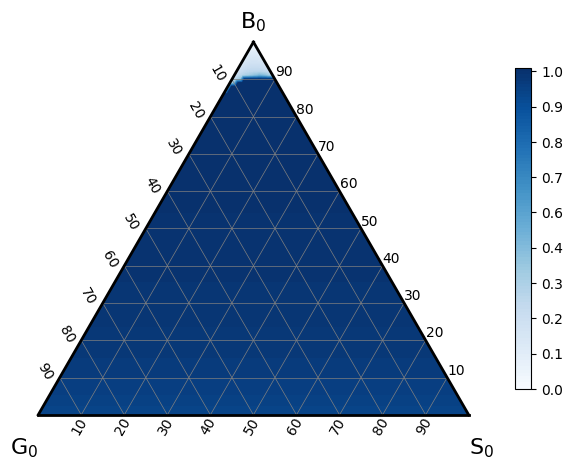

In [314]:
td = TernaryDiagram(materials=herbivores)

td.contour(SED_NUTR[herbivores], z=SED_NUTR['Normalized_Cp'], cmap='Blues');

In [147]:
d = dict()
SED_NUTR
herb = SED_NUTR[['G0', 'B0', 'S0']]

herb_tu = list(herb.itertuples(index=False, name=None))
cor_a = SED_NUTR['Cp'].tolist() 

result = dict(zip(herb_tu, cor_a))

{(0, 0, 100): 0.47110077282893953,
 (1, 0, 99): 0.4711010107614265,
 (2, 0, 98): 0.47110100363762325,
 (3, 0, 97): 0.4711010058478943,
 (4, 0, 96): 0.47110101226092227,
 (5, 0, 95): 0.4711010169755454,
 (6, 0, 94): 0.47110102362711265,
 (7, 0, 93): 0.47110102853258096,
 (8, 0, 92): 0.47110103280160315,
 (9, 0, 91): 0.47110103750977017,
 (10, 0, 90): 0.471101045277115,
 (11, 0, 89): 0.4711010483927853,
 (12, 0, 88): 0.4711010509801827,
 (13, 0, 87): 0.4711010583753844,
 (14, 0, 86): 0.4711010593685813,
 (15, 0, 85): 0.47110106734609003,
 (16, 0, 84): 0.47110106822213077,
 (17, 0, 83): 0.471101072031064,
 (18, 0, 82): 0.471101079998734,
 (19, 0, 81): 0.4711010794628903,
 (20, 0, 80): 0.47110108331442524,
 (21, 0, 79): 0.4711010932730847,
 (22, 0, 78): 0.4711010910894189,
 (23, 0, 77): 0.47110109259918587,
 (24, 0, 76): 0.47110109821595586,
 (25, 0, 75): 0.4711011045488696,
 (26, 0, 74): 0.47110110333368715,
 (27, 0, 73): 0.47110110428402224,
 (28, 0, 72): 0.4711011071914196,
 (28, 0, 71)

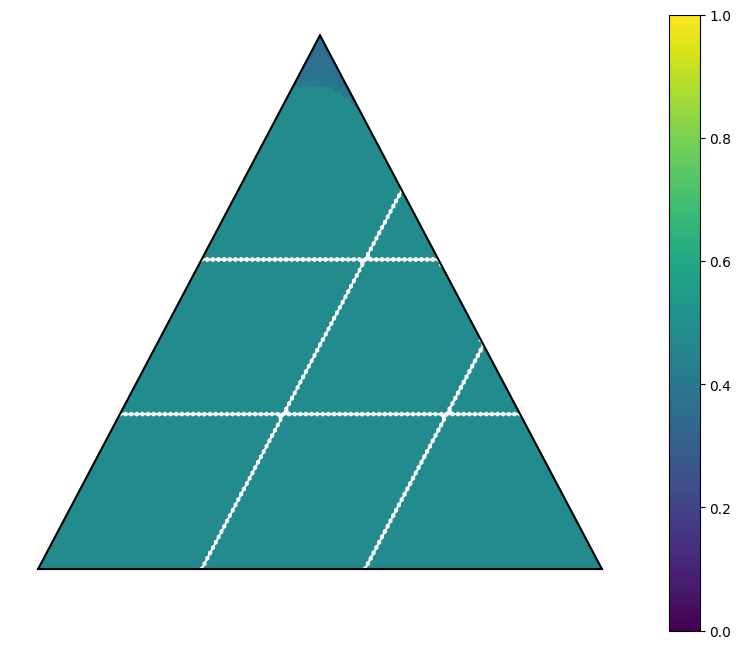

In [146]:
import ternary

scale = 100
figure, tax = ternary.figure(scale=scale)
figure.set_size_inches(10, 8)
tax.heatmap(result, style="h", vmin=0, vmax=1)
tax.boundary()
tax.clear_matplotlib_ticks()
tax.get_axes().axis('off')
tax.set_title("")